In [1]:
import numpy as np
import torch
import math
import transforms3d
import trimesh as tm
import open3d as o3d
import plotly.graph_objects as go
from utils.hand_model import HandModel
from utils.object_model import ObjectModel

# Set object and device
object_code = 's20349'
device = 'cuda'

# Load processed DexGYS dataset sample
data_path = f'/home/dmsgk724/CVPR_2026/dataset/processed_dexgys3/{object_code}/xyzc.npy'
point_cloud = np.load(data_path)

print(f"Point cloud shape: {point_cloud.shape}")
print(f"Number of contact maps: {point_cloud.shape[1] - 3}")

# Extract xyz coordinates and contact maps
xyz = point_cloud[:, :3]
contact_maps = point_cloud[:, 3:]
grasp_idx = 0
contact_vals = contact_maps[:, grasp_idx]

print(f"Contact values range: {contact_vals.min():.3f} to {contact_vals.max():.3f}")

# Initialize models
hand_model = HandModel(
    mjcf_path='mjcf/shadow_hand_wrist_free.xml',
    mesh_path='mjcf/meshes',
    contact_points_path='mjcf/contact_points.json',
    penetration_points_path='mjcf/penetration_points.json',
    device=device
)

object_model = ObjectModel(
    data_root_path='/home/dmsgk724/CVPR_2026/grasping/Grasp-as-You-Say/asset_process/data/meshdata',
    batch_size_each=1,
    num_samples=2000,
    device=device
)

object_model.initialize([object_code])
print("Models initialized successfully!")

Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.
Point cloud shape: (10000, 16)
Number of contact maps: 13
Contact values range: 0.000 to 1.000
Precomputing front surface normals for hand links...
  robot0:palm: 376 faces processed
  robot0:ffproximal_child: 3840 faces processed
  robot0:ffmiddle_child: 3840 faces processed
  robot0:ffdistal_child: 3840 faces processed
  robot0:mfproximal_child: 3840 faces processed
  robot0:mfmiddle_child: 3840 faces processed
  robot0:mfdistal_child: 3840 faces processed
  robot0:rfproximal_child: 3840 faces processed
  robot0:rfmiddle_child: 3840 faces processed
  robot0:rfdistal_child: 3840 faces processed
  robot0:lfmetacarpal_child: 188 faces processed
  robot0:lfproximal_child: 3840 faces processed
  robot0:lfmiddle_child: 3840 faces processed
  robot0:lfdistal_child: 3840 faces processed
  robot0:thbase_child: 188 faces proces

In [2]:
# Extract contact points and compute normal
contact_points = xyz[contact_vals > 0.5]
mean_point = np.mean(contact_points, axis=0)

# Compute point cloud normals
pcd = o3d.geometry.PointCloud()
pcd.points = o3d.utility.Vector3dVector(xyz)
pcd.estimate_normals(
    search_param=o3d.geometry.KDTreeSearchParamHybrid(radius=0.1, max_nn=30)
)

# Find closest point to mean contact point
distances = np.linalg.norm(xyz - mean_point, axis=1)
closest_idx = np.argmin(distances)
representative_normal = np.asarray(pcd.normals)[closest_idx]

# Ensure normal points outward
center = xyz.mean(axis=0)
if np.dot(representative_normal, xyz[closest_idx] - center) < 0:
    representative_normal = -representative_normal

print(f"Found {len(contact_points)} contact points")
print(f"Closest point index: {closest_idx}")
print(f"Representative normal: {representative_normal}")

# Configuration class
class GraspInitializationArgs:
    def __init__(self):
        self.distance_lower = 0.0  
        self.distance_upper = 0.1
        self.theta_lower = -math.pi / 6
        self.theta_upper = math.pi / 6
        self.jitter_strength = 0.1
        self.n_contact = 4
        
        # Energy weights
        self.w_fc = 1.0
        self.w_bar = 1.0
        self.w_dis = 100.0  # Distance energy weight
        self.w_palm = 1.0
        self.w_pen = 100.0
        self.w_spen = 10.0
        self.w_joints = 1.0
        self.w_dir = 10.0

args = GraspInitializationArgs()
print("Configuration created successfully!")

Found 7048 contact points
Closest point index: 3564
Representative normal: [ 0.99821008 -0.01857136 -0.05684832]
Configuration created successfully!


In [3]:
# Initialize hand pose using contact normal direction
def initialize_hand_with_contact_normal(hand_model, object_model, closest_point, contact_normal, args):
    """Initialize grasp using contact normal direction"""
    device = hand_model.device
    n_objects = len(object_model.object_mesh_list)
    batch_size_each = object_model.batch_size_each
    total_batch_size = n_objects * batch_size_each

    closest_point_torch = torch.tensor(closest_point, dtype=torch.float, device=device)
    contact_normal_torch = torch.tensor(contact_normal, dtype=torch.float, device=device)
    
    translation = torch.zeros([total_batch_size, 3], dtype=torch.float, device=device)
    rotation = torch.zeros([total_batch_size, 3, 3], dtype=torch.float, device=device)

    for i in range(n_objects):
        # Create inflated convex hull
        mesh_origin = object_model.object_mesh_list[i].convex_hull
        vertices = mesh_origin.vertices.copy()
        faces = mesh_origin.faces
        vertices *= object_model.object_scale_tensor[i].max().item()
        mesh_origin = tm.Trimesh(vertices, faces)
        vertices += 0.2 * vertices / np.linalg.norm(vertices, axis=1, keepdims=True)
        mesh = tm.Trimesh(vertices=vertices, faces=faces).convex_hull
        
        # Find intersection point along normal direction
        ray_origins = closest_point_torch.detach().cpu().numpy().reshape(1, -1)
        ray_directions = contact_normal_torch.detach().cpu().numpy().reshape(1, -1)
        
        locations, _, _ = mesh.ray.intersects_location(
            ray_origins=ray_origins, ray_directions=ray_directions
        )
        
        if len(locations) > 0:
            intersection_point = locations[0]
            p_single = torch.tensor(intersection_point, dtype=torch.float, device=device)
        else:
            extension_distance = 0.3
            p_single = closest_point_torch + extension_distance * contact_normal_torch
        
        # Replicate for batch
        p = p_single.unsqueeze(0).repeat(batch_size_each, 1)
        n = -contact_normal_torch / contact_normal_torch.norm()
        n = n.view(1, 3).repeat(batch_size_each, 1)

        distance = args.distance_lower + (args.distance_upper - args.distance_lower) * torch.rand([batch_size_each], device=device)
        deviate_theta = args.theta_lower + (args.theta_upper - args.theta_lower) * torch.rand([batch_size_each], device=device)
        process_theta = 2 * math.pi * torch.rand([batch_size_each], device=device)
        rotate_theta = 2 * math.pi * torch.rand([batch_size_each], device=device)

        rotation_local = torch.zeros([batch_size_each, 3, 3], dtype=torch.float, device=device)
        rotation_global = torch.zeros([batch_size_each, 3, 3], dtype=torch.float, device=device)
        
        for j in range(batch_size_each):
            rotation_local[j] = torch.tensor(
                transforms3d.euler.euler2mat(process_theta[j], deviate_theta[j], rotate_theta[j], axes='rzxz'),
                dtype=torch.float, device=device
            )
            rotation_global[j] = torch.tensor(
                transforms3d.euler.euler2mat(math.atan2(n[j, 1], n[j, 0]) - math.pi / 2, -math.acos(n[j, 2]), 0, axes='rzxz'),
                dtype=torch.float, device=device
            )
        
        translation[i * batch_size_each: (i + 1) * batch_size_each] = p - distance.unsqueeze(1) * (
            rotation_global @ rotation_local @ torch.tensor([0, 0, 1], dtype=torch.float, device=device).reshape(1, -1, 1)
        ).squeeze(2)
        
        rotation_hand = torch.tensor(transforms3d.euler.euler2mat(0, -np.pi / 3, 0, axes='rzxz'), dtype=torch.float, device=device)
        rotation[i * batch_size_each: (i + 1) * batch_size_each] = rotation_global @ rotation_local @ rotation_hand
    
    # Initialize joint angles
    joint_angles_mu = torch.tensor([0.1, 0, 0.6, 0, 0, 0, 0.6, 0, -0.1, 0, 0.6, 0, 0, -0.2, 0, 0.6, 0, 0, 1.2, 0, -0.2, 0], dtype=torch.float, device=device)
    joint_angles_sigma = args.jitter_strength * (hand_model.joints_upper - hand_model.joints_lower)
    joint_angles = torch.zeros([total_batch_size, hand_model.n_dofs], dtype=torch.float, device=device)
    
    for i in range(hand_model.n_dofs):
        torch.nn.init.trunc_normal_(
            joint_angles[:, i], joint_angles_mu[i], joint_angles_sigma[i],
            hand_model.joints_lower[i] - 1e-6, hand_model.joints_upper[i] + 1e-6
        )

    hand_pose = torch.cat([
        translation,
        rotation.transpose(1, 2)[:, :2].reshape(-1, 6),
        joint_angles
    ], dim=1)
    hand_pose.requires_grad_()

    contact_point_indices = torch.randint(hand_model.n_contact_candidates, size=[total_batch_size, args.n_contact], device=device)
    hand_model.set_parameters(hand_pose, contact_point_indices)

# Initialize the hand model
initialize_hand_with_contact_normal(hand_model, object_model, xyz[closest_idx], representative_normal, args)
print("Hand model initialized with pose and contact points!")
print(f"Hand pose shape: {hand_model.hand_pose.shape}")
print(f"Contact points shape: {hand_model.contact_points.shape}")

Hand model initialized with pose and contact points!
Hand pose shape: torch.Size([1, 31])
Contact points shape: torch.Size([1, 4, 3])


In [4]:
# Distance Energy Implementation (NEW)
def compute_distance_energy(hand_model, object_model, d0=0.01, w_palm=1.0):
    """
    Compute distance energy as defined in equation (3):
    E_dis = sum_{i=1}^{n} d(x_i, O) + w_palm * |d(x_palm, O) - d0|
    
    Where:
    - x_i are fingertip contact points
    - x_palm are palm contact points  
    - O is the object surface
    - d0 is the desired palm distance (default: 1cm = 0.01m)
    """
    device = hand_model.device
    batch_size = hand_model.contact_points.shape[0]
    
    # Get all contact points
    contact_points = hand_model.contact_points  # (batch_size, n_contact, 3)
    
    # Calculate distances from contact points to object surface
    distances, _ = object_model.cal_distance(contact_points)  # (batch_size, n_contact)
    distances = distances.abs()  # Ensure positive distances
    
    # Fingertip distance energy: sum of distances for all contact points
    E_dis_fingertips = torch.sum(distances, dim=1)  # (batch_size,)
    
    return E_dis_fingertips

# Barrier Energy (E_bar) Implementation  
def barrier_function(d, d_thr):
    """
    Truncated barrier function from IPC simulator.
    
    b(d, d_thr) = {
        -(d - d_thr)^2 * ln(d / d_thr),  if 0 < d < d_thr
        0,                               if d >= d_thr
    }
    """
    device = d.device
    
    # Create mask for valid distance range (0 < d < d_thr)
    valid_mask = (d > 0) & (d < d_thr)
    
    # Initialize result tensor
    barrier_values = torch.zeros_like(d, device=device)
    
    # Compute barrier function only for valid distances
    if valid_mask.any():
        d_valid = d[valid_mask]
        d_ratio = d_valid / d_thr
        
        # Clamp d_ratio to prevent log(0) issues
        d_ratio = torch.clamp(d_ratio, min=1e-8, max=1.0-1e-8)
        
        # Compute barrier: -(d - d_thr)^2 * ln(d / d_thr)
        barrier_valid = -(d_valid - d_thr).pow(2) * torch.log(d_ratio)
        barrier_values[valid_mask] = barrier_valid
    
    return barrier_values

def extract_target_part_from_affordance(point_cloud_xyz, contact_map_values, contact_threshold=0.3):
    """
    Extract target part points from affordance grounding contact map.
    """
    # Points with contact values above threshold are considered target part
    target_mask = contact_map_values > contact_threshold
    target_part_points = point_cloud_xyz[target_mask]
    return target_part_points, target_mask, ~target_mask

def compute_E_bar_affordance(hand_model, object_model, point_cloud_xyz, contact_map_values, 
                           contact_threshold=0.5, d_thr=0.01):
    """
    Compute part-contact energy E_bar using affordance grounding contact map.
    
    E_bar = sum_{n=1}^{5} sum_{j not in target_part} b(d(x_n, p_j), d_thr)
    
    Where:
    - {x_n}_{n=1}^5 are the 5 fingertips
    - p_j are point clouds sampled from object surface outside the target part (defined by affordance)
    - b(d, d_thr) is the truncated barrier function
    """
    batch_size = hand_model.contact_points.shape[0]
    device = hand_model.device
    
    # Extract target part from affordance contact map
    target_part_points, target_mask, non_target_mask  = extract_target_part_from_affordance(
        point_cloud_xyz, contact_map_values, contact_threshold
    )
    print(non_target_mask.shape)
    
    # Get fingertip positions (using contact points as proxy for fingertips)
    fingertips = hand_model.contact_points  # (batch_size, n_contact, 3)
    n_fingertips = fingertips.shape[1]
    
    # # Get all object surface points
    # object_scale = object_model.object_scale_tensor.flatten().unsqueeze(1).unsqueeze(2)
    # all_surface_points = object_model.surface_points_tensor * object_scale  # (batch_size, num_samples, 3)
    
    # # Convert to torch tensors
    # target_part_points_torch = torch.tensor(target_part_points, dtype=torch.float, device=device)
    
    # # Identify non-target part points in object surface samples
    # n_surface_points = all_surface_points.shape[1]
    
    # Compute E_bar for each batch
    E_bar_total = torch.zeros(batch_size, device=device)
    
    for batch_idx in range(batch_size):
        E_bar_batch = 0.0
        
        # Get non-target surface points for this batch
        non_target_points = torch.tensor(point_cloud_xyz[non_target_mask], device=device)  # Use all surface points for simplicity
        
        # For each fingertip, compute barrier function with respect to non-target points
        for fingertip_idx in range(n_fingertips):
            fingertip_pos = fingertips[batch_idx, fingertip_idx:fingertip_idx+1]  # (1, 3)
            
            # Compute distances from this fingertip to all non-target points
            distances = torch.cdist(fingertip_pos, non_target_points).squeeze(0)  # (n_non_target,)
            
            # Apply barrier function
            barrier_values = barrier_function(distances, d_thr)
            
            # Sum barrier values for this fingertip
            E_bar_batch += barrier_values.sum()
        
        E_bar_total[batch_idx] = E_bar_batch
    
    # Prepare target part information
    target_part_info = {
        'n_target_points': len(target_part_points),
        'n_total_points': len(point_cloud_xyz),
        'target_ratio': len(target_part_points) / len(point_cloud_xyz),
        'contact_threshold': contact_threshold,
        'target_contact_values_range': (contact_map_values[target_mask].min(), contact_map_values[target_mask].max()) if len(target_part_points) > 0 else (0, 0)
    }
    
    return E_bar_total, target_part_info

# Other Energy Functions
def compute_force_closure_energy(hand_model, object_model):
    """Compute force closure energy"""
    batch_size, n_contact, _ = hand_model.contact_points.shape
    device = hand_model.device
    
    distance, contact_normal = object_model.cal_distance(hand_model.contact_points)
    contact_normal = contact_normal.reshape(batch_size, 1, 3 * n_contact)

    transformation_matrix = torch.tensor([[0, 0, 0, 0, 0, -1, 0, 1, 0],
                                          [0, 0, 1, 0, 0, 0, -1, 0, 0],
                                          [0, -1, 0, 1, 0, 0, 0, 0, 0]], 
                                         dtype=torch.float, device=device)

    g = torch.cat([
        torch.eye(3, dtype=torch.float, device=device).expand(batch_size, n_contact, 3, 3).reshape(batch_size, 3 * n_contact, 3),
        (hand_model.contact_points @ transformation_matrix).view(batch_size, 3 * n_contact, 3)
    ], dim=2).float().to(device)
    
    norm = torch.norm(contact_normal @ g, dim=[1, 2])
    return norm * norm

def compute_hand_surface_normals(hand_model):
    """
    Compute surface normals for each contact point on the hand meshes.
    For each contact point, find the nearest face and return its normal vector.
    
    Returns:
        hand_normals: (batch_size, n_contact, 3) tensor of hand surface normals
    """
    batch_size, n_contact, _ = hand_model.contact_points.shape
    device = hand_model.device
    
    # Initialize tensor to store hand normals
    hand_normals = torch.zeros(batch_size, n_contact, 3, device=device)
    
    # Get contact points in local coordinates for each link
    contact_points_local = hand_model.contact_candidates[hand_model.contact_point_indices]  # (batch_size, n_contact, 3)
    
    for batch_idx in range(batch_size):
        for contact_idx in range(n_contact):
            # Get the link index for this contact point
            global_contact_idx = hand_model.contact_point_indices[batch_idx, contact_idx]
            link_idx = hand_model.global_index_to_link_index[global_contact_idx]
            link_name = list(hand_model.mesh.keys())[link_idx]
            
            # Get mesh data for this link
            vertices = hand_model.mesh[link_name]['vertices']
            faces = hand_model.mesh[link_name]['faces']
            
            # Get contact point in local coordinates
            contact_point = contact_points_local[batch_idx, contact_idx]
            
            # Compute face normals for all faces in this link
            face_vertices = vertices[faces]  # (n_faces, 3, 3)
            
            # Compute normal vectors using cross product
            v1 = face_vertices[:, 1] - face_vertices[:, 0]  # (n_faces, 3)
            v2 = face_vertices[:, 2] - face_vertices[:, 0]  # (n_faces, 3)
            face_normals = torch.cross(v1, v2, dim=1)  # (n_faces, 3)
            face_normals = face_normals / (torch.norm(face_normals, dim=1, keepdim=True) + 1e-8)
            
            # Find closest face to the contact point
            face_centers = face_vertices.mean(dim=1)  # (n_faces, 3)
            distances_to_faces = torch.norm(face_centers - contact_point.unsqueeze(0), dim=1)
            closest_face_idx = torch.argmin(distances_to_faces)
            
            # Get the normal of the closest face and ensure it points outward (front side)
            face_normal = face_normals[closest_face_idx]
            
            # Ensure normal points outward from the hand (front side)
            hand_normals[batch_idx, contact_idx] = face_normal
    
    return hand_normals

def compute_E_dir(hand_model, object_model):
    """
    Compute E_dir energy function for contact normal alignment.
    
    E_dir = sum over contact points of (1 - ci · Ni)
    where:
    - ci: contact normal vector on object surface pointing inwards into object
    - Ni: normal vector of front surface of contact link, pointing outwards from hand
    
    Returns:
        E_dir: (batch_size,) tensor of directional alignment energies
    """
    batch_size, n_contact, _ = hand_model.contact_points.shape
    device = hand_model.device
    
    # Get object surface normals at contact points (ci)
    # These point inward into the object
    _, object_contact_normals = object_model.cal_distance(hand_model.contact_points)
    object_contact_normals = object_contact_normals.reshape(batch_size, n_contact, 3)
    
    # Get hand surface normals at contact points (Ni)
    # These should point outward from the hand (front side)
    hand_surface_normals = compute_hand_surface_normals(hand_model)
    
    # Compute cosine similarity for each contact point
    # ci · Ni = dot product between object normal (inward) and hand normal (outward)
    cosine_similarities = torch.sum(object_contact_normals * hand_surface_normals, dim=2)  # (batch_size, n_contact)
    
    # E_dir = sum over all contact points of (1 - ci · Ni)
    # This encourages alignment between inward object normals and outward hand normals
    E_dir = torch.sum(1.0 - cosine_similarities, dim=1)  # (batch_size,)
    
    return E_dir

def compute_regularization_energies(hand_model, object_model):
    """Compute regularization energies"""
    # Joint limit penalty
    E_joints = torch.sum((hand_model.hand_pose[:, 9:] > hand_model.joints_upper) * (hand_model.hand_pose[:, 9:] - hand_model.joints_upper), dim=-1) + \
               torch.sum((hand_model.hand_pose[:, 9:] < hand_model.joints_lower) * (hand_model.joints_lower - hand_model.hand_pose[:, 9:]), dim=-1)

    # Penetration penalty
    object_scale = object_model.object_scale_tensor.flatten().unsqueeze(1).unsqueeze(2)
    object_surface_points = object_model.surface_points_tensor * object_scale
    distances = hand_model.cal_distance(object_surface_points)
    distances[distances <= 0] = 0
    E_pen = distances.sum(-1)

    # Self-penetration penalty
    E_spen = hand_model.self_penetration()
    
    # Contact direction alignment (E_dir)
    E_dir = compute_E_dir(hand_model, object_model)
    
    return E_joints, E_pen, E_spen, E_dir

# Test all energy components
print("=== Computing All Energy Components ===")

# Distance Energy (NEW)
E_dis = compute_distance_energy(hand_model, object_model, d0=0.01, w_palm=1.0)
print(f"E_dis: {E_dis.item():.6f}")


# Barrier Energy (E_bar)
E_bar, target_info = compute_E_bar_affordance(
    hand_model, object_model, xyz, contact_vals, 
    contact_threshold=0.5, d_thr=0.02
)
print(f"E_bar (Barrier): {E_bar.item():.6f}")
print(f"Target part points: {target_info['n_target_points']} ({target_info['target_ratio']:.1%})")

# Other Energy Components
E_fc = compute_force_closure_energy(hand_model, object_model)
E_joints, E_pen, E_spen, E_dir = compute_regularization_energies(hand_model, object_model)

print(f"E_fc (Force Closure): {E_fc.item():.6f}")
print(f"E_pen (Penetration): {E_pen.item():.6f}")
print(f"E_spen (Self-penetration): {E_spen.item():.6f}")
print(f"E_joints (Joint limits): {E_joints.item():.6f}")
print(f"E_dir (Direction Alignment): {E_dir.item():.6f}")

# Complete Energy Function (Equation 4)
# E = ωFC*EFC + ωbar*Ebar + ωdis*Edis + ωreg*Ereg
E_reg = args.w_pen * E_pen + args.w_spen * E_spen + args.w_joints * E_joints + args.w_dir * E_dir
E_total = args.w_fc * E_fc + args.w_bar * E_bar + args.w_dis * E_dis + E_reg

print(f"\n=== Complete Energy Function (Equation 4) ===")
print(f"E_total: {E_total.item():.6f}")
print(f"")
print(f"Main Components:")
print(f"  E_fc (weighted): {(args.w_fc * E_fc).item():.6f}")
print(f"  E_bar (weighted): {(args.w_bar * E_bar).item():.6f}")
print(f"  E_dis (weighted): {(args.w_dis * E_dis).item():.6f}")
print(f"  E_reg (weighted): {E_reg.item():.6f}")
print(f"")
print(f"Weights: w_fc={args.w_fc}, w_bar={args.w_bar}, w_dis={args.w_dis}")
print(f"         w_pen={args.w_pen}, w_spen={args.w_spen}")
print(f"         w_joints={args.w_joints}, w_dir={args.w_dir}")

print(f"\n=== Regularization Energy Breakdown ===")
print(f"E_reg_total: {E_reg.item():.6f}")
print(f"  - E_pen (weighted): {(args.w_pen * E_pen).item():.6f}")
print(f"  - E_spen (weighted): {(args.w_spen * E_spen).item():.6f}")
print(f"  - E_joints (weighted): {(args.w_joints * E_joints).item():.6f}")
print(f"  - E_dir (weighted): {(args.w_dir * E_dir).item():.6f}")

=== Computing All Energy Components ===
E_dis: 0.632552
(10000,)
E_bar (Barrier): 0.000000
Target part points: 7048 (70.5%)
E_fc (Force Closure): 15.378910
E_pen (Penetration): 0.000000
E_spen (Self-penetration): 0.004865
E_joints (Joint limits): 0.000000
E_dir (Direction Alignment): 6.310423

=== Complete Energy Function (Equation 4) ===
E_total: 141.786972

Main Components:
  E_fc (weighted): 15.378910
  E_bar (weighted): 0.000000
  E_dis (weighted): 63.255184
  E_reg (weighted): 63.152878

Weights: w_fc=1.0, w_bar=1.0, w_dis=100.0
         w_pen=100.0, w_spen=10.0
         w_joints=1.0, w_dir=10.0

=== Regularization Energy Breakdown ===
E_reg_total: 63.152878
  - E_pen (weighted): 0.000000
  - E_spen (weighted): 0.048647
  - E_joints (weighted): 0.000000
  - E_dir (weighted): 63.104233


In [5]:
# Visualization
try:
    hand_plotly = hand_model.get_plotly_data(i=0, opacity=0.7, color='lightblue', with_contact_points=True)
    object_plotly = object_model.get_plotly_data(i=0, color='lightgreen', opacity=0.6)
    
    fig = go.Figure(hand_plotly + object_plotly)
    
    # Add contact points from affordance map
    fig.add_trace(go.Scatter3d(
        x=contact_points[:, 0],
        y=contact_points[:, 1], 
        z=contact_points[:, 2],
        mode='markers',
        marker=dict(color='red', size=3),
        name='Affordance Contact Points'
    ))
    
    # Add closest point and normal
    closest_point = xyz[closest_idx]
    normal_end = closest_point + representative_normal * 0.05
    
    fig.add_trace(go.Scatter3d(
        x=[closest_point[0]],
        y=[closest_point[1]],
        z=[closest_point[2]],
        mode='markers',
        marker=dict(color='blue', size=8),
        name='Closest Point'
    ))
    
    fig.add_trace(go.Scatter3d(
        x=[closest_point[0], normal_end[0]],
        y=[closest_point[1], normal_end[1]],
        z=[closest_point[2], normal_end[2]],
        mode='lines',
        line=dict(color='orange', width=6),
        name='Contact Normal'
    ))
    
    fig.update_layout(
        title="Affordance-Aligned Grasping with Distance Energy",
        scene=dict(aspectmode='data'),
        width=800,
        height=600
    )
    
    fig.show()
    print("Visualization created successfully!")
    
except Exception as e:
    print(f"Visualization failed: {e}")
    print("Hand model may not be properly initialized for visualization")

Visualization created successfully!


In [8]:
# Energy Optimization with Annealing (Modified from generate_grasps.py)
from utils.optimizer import Annealing

def compute_total_energy_for_annealing(hand_model, object_model, xyz, contact_vals, args):
    """
    Compute total energy function for annealing optimization
    Returns individual components like in generate_grasps.py
    """
    # Distance Energy (NEW)
    E_dis = compute_distance_energy(hand_model, object_model, d0=0.01, w_palm=args.w_palm)
    
    # Barrier Energy (E_bar) 
    E_bar, _ = compute_E_bar_affordance(
        hand_model, object_model, xyz, contact_vals, 
        contact_threshold=0.5, d_thr=0.02
    )
    
    # Force Closure Energy
    E_fc = compute_force_closure_energy(hand_model, object_model)
    
    # Regularization Energies
    E_joints, E_pen, E_spen, E_dir = compute_regularization_energies(hand_model, object_model)
    
    # Total energy (Equation 4) - following generate_grasps.py style
    # Note: In original code, only E_dis, E_pen, E_spen, E_joints are weighted
    # We add our new energy components (E_bar, E_dir) with their weights
    energy = E_fc + args.w_dis * E_dis + args.w_pen * E_pen + args.w_spen * E_spen + args.w_joints * E_joints + args.w_bar * E_bar + args.w_dir * E_dir
    
    return energy, E_fc, E_dis, E_pen, E_spen, E_joints, E_bar, E_dir

def optimize_grasp_annealing(hand_model, object_model, xyz, contact_vals, args, 
                            num_steps=6000, verbose_step=500):
    """
    Optimize grasp using Annealing optimizer (same as generate_grasps.py)
    
    Args:
        hand_model: HandModel instance
        object_model: ObjectModel instance
        xyz: Point cloud coordinates
        contact_vals: Contact values from affordance map
        args: Configuration arguments
        num_steps: Number of optimization steps (default: 6000 like original)
        verbose_step: Print energy every N steps
        
    Returns:
        energy_history: List of energy dictionaries for each step
        optimized_pose: Final optimized hand pose
    """
    
    # Store initial pose
    hand_pose_st = hand_model.hand_pose.detach()
    
    # Configure annealing optimizer (same as generate_grasps.py)
    optim_config = {
        'switch_possibility': args.switch_possibility,
        'starting_temperature': args.starting_temperature,
        'temperature_decay': args.temperature_decay,
        'annealing_period': args.annealing_period,
        'step_size': args.step_size,
        'stepsize_period': args.stepsize_period,
        'mu': args.mu,
        'device': hand_model.device
    }
    optimizer = Annealing(hand_model, **optim_config)
    
    # Energy history for monitoring
    energy_history = []
    
    print(f"=== Starting Annealing Optimization ===")
    print(f"Steps: {num_steps}")
    print(f"Annealing Config: temp={args.starting_temperature}, decay={args.temperature_decay}")
    print(f"Step size: {args.step_size}, mu: {args.mu}")
    
    # Initial energy computation
    energy, E_fc, E_dis, E_pen, E_spen, E_joints, E_bar, E_dir = compute_total_energy_for_annealing(
        hand_model, object_model, xyz, contact_vals, args
    )
    
    print(f"Initial Total Energy: {energy.sum().item():.6f}")
    
    # Backward pass for initial gradients
    energy.sum().backward(retain_graph=True)
    
    for step in range(1, num_steps + 1):
        # Try step (annealing)
        s = optimizer.try_step()
        
        # Zero gradients
        optimizer.zero_grad()
        
        # Compute new energy
        new_energy, new_E_fc, new_E_dis, new_E_pen, new_E_spen, new_E_joints, new_E_bar, new_E_dir = compute_total_energy_for_annealing(
            hand_model, object_model, xyz, contact_vals, args
        )
        
        # Backward pass
        new_energy.sum().backward(retain_graph=True)
        
        # Accept/reject step
        with torch.no_grad():
            accept, temperature = optimizer.accept_step(energy, new_energy)
            
            # Update energies for accepted steps
            energy[accept] = new_energy[accept]
            E_fc[accept] = new_E_fc[accept]
            E_dis[accept] = new_E_dis[accept]
            E_pen[accept] = new_E_pen[accept]
            E_spen[accept] = new_E_spen[accept]
            E_joints[accept] = new_E_joints[accept]
            E_bar[accept] = new_E_bar[accept]
            E_dir[accept] = new_E_dir[accept]
        
        # Store energy history
        energy_dict = {
            'step': step,
            'E_total': energy.mean().item(),
            'E_fc': E_fc.mean().item(),
            'E_dis': E_dis.mean().item(),
            'E_pen': E_pen.mean().item(),
            'E_spen': E_spen.mean().item(),
            'E_joints': E_joints.mean().item(),
            'E_bar': E_bar.mean().item(),
            'E_dir': E_dir.mean().item(),
            'temperature': temperature.item(),
            'step_size': s.item(),
            'acceptance_rate': accept.float().mean().item()
        }
        energy_history.append(energy_dict)
        
        # Verbose output
        if step % verbose_step == 0 or step == num_steps:
            print(f"Step {step:4d}: E_total={energy.sum().item():.6f}, "
                  f"E_fc={E_fc.mean().item():.4f}, "
                  f"E_dis={E_dis.mean().item():.4f}, "
                  f"E_bar={E_bar.mean().item():.4f}, "
                  f"temp={temperature.item():.3f}, "
                  f"accept={accept.float().mean().item():.2f}")
    
    print(f"\n=== Annealing Optimization Complete ===")
    print(f"Final Total Energy: {energy.sum().item():.6f}")
    print(f"Final Temperature: {temperature.item():.6f}")
    
    return energy_history, hand_model.hand_pose.clone()

def plot_annealing_history(energy_history):
    """
    Plot annealing optimization history
    """
    import matplotlib.pyplot as plt
    
    steps = [e['step'] for e in energy_history]
    E_total = [e['E_total'] for e in energy_history]
    E_fc = [e['E_fc'] for e in energy_history]
    E_dis = [e['E_dis'] for e in energy_history]
    E_bar = [e['E_bar'] for e in energy_history]
    E_dir = [e['E_dir'] for e in energy_history]
    temperatures = [e['temperature'] for e in energy_history]
    acceptance_rates = [e['acceptance_rate'] for e in energy_history]
    
    # Create subplots
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(15, 10))
    
    # Total energy
    ax1.plot(steps, E_total, 'b-', linewidth=2)
    ax1.set_title('Total Energy (Annealing)')
    ax1.set_xlabel('Optimization Step')
    ax1.set_ylabel('E_total')
    ax1.grid(True)
    
    # Main energy components
    ax2.plot(steps, E_fc, 'r-', label='E_fc (Force Closure)', linewidth=2)
    ax2.plot(steps, E_dis, 'm-', label='E_dis (Distance - NEW)', linewidth=2)
    ax2.plot(steps, E_bar, 'g-', label='E_bar (Barrier - NEW)', linewidth=2)
    ax2.plot(steps, E_dir, 'c-', label='E_dir (Direction - NEW)', linewidth=2)
    ax2.set_title('Energy Components')
    ax2.set_xlabel('Optimization Step')
    ax2.set_ylabel('Energy Value')
    ax2.legend()
    ax2.grid(True)
    
    # Temperature decay
    ax3.semilogy(steps, temperatures, 'r-', linewidth=2)
    ax3.set_title('Annealing Temperature')
    ax3.set_xlabel('Optimization Step')
    ax3.set_ylabel('Temperature (log scale)')
    ax3.grid(True)
    
    # Acceptance rate
    ax4.plot(steps, acceptance_rates, 'g-', linewidth=2)
    ax4.set_title('Acceptance Rate')
    ax4.set_xlabel('Optimization Step')
    ax4.set_ylabel('Acceptance Rate')
    ax4.set_ylim([0, 1])
    ax4.grid(True)
    
    plt.tight_layout()
    plt.show()

# Update configuration for annealing (same as generate_grasps.py default values)
class AnnealingGraspArgs:
    def __init__(self):
        # Distance parameters for hand positioning
        self.distance_lower = 0.2
        self.distance_upper = 0.3
        self.theta_lower = -math.pi / 6
        self.theta_upper = math.pi / 6
        self.jitter_strength = 0.1
        self.n_contact = 4
        
        # Energy weights (following generate_grasps.py)
        self.w_dis = 100.0      # Original distance weight
        self.w_pen = 100.0      # Penetration weight  
        self.w_spen = 10.0      # Self-penetration weight
        self.w_joints = 1.0     # Joint limits weight
        
        # NEW energy weights
        self.w_bar = 1.0        # Barrier energy weight
        self.w_dir = 10.0       # Direction alignment weight
        self.w_palm = 1.0       # Palm distance weight
        
        # Annealing parameters (same as generate_grasps.py)
        self.switch_possibility = 0.5
        self.starting_temperature = 18.0
        self.temperature_decay = 0.95
        self.annealing_period = 30
        self.step_size = 0.005
        self.stepsize_period = 50
        self.mu = 0.98

# Update args to annealing version
annealing_args = AnnealingGraspArgs()

print("Annealing optimization functions defined successfully!")
print(f"Energy weights: w_dis={annealing_args.w_dis}, w_bar={annealing_args.w_bar}, w_dir={annealing_args.w_dir}")
print(f"Annealing params: temp={annealing_args.starting_temperature}, decay={annealing_args.temperature_decay}")

Annealing optimization functions defined successfully!
Energy weights: w_dis=100.0, w_bar=1.0, w_dir=10.0
Annealing params: temp=18.0, decay=0.95


=== Starting Annealing Grasp Optimization ===
=== Starting Annealing Optimization ===
Steps: 1000
Annealing Config: temp=18.0, decay=0.95
Step size: 0.005, mu: 0.98
(10000,)
Initial Total Energy: 98.917633
(10000,)
(10000,)
(10000,)
(10000,)
(10000,)
(10000,)
(10000,)
(10000,)
(10000,)
(10000,)
(10000,)
(10000,)
(10000,)
(10000,)
(10000,)
(10000,)
(10000,)
(10000,)
(10000,)
(10000,)
(10000,)
(10000,)
(10000,)
(10000,)
(10000,)
(10000,)
(10000,)
(10000,)
(10000,)
(10000,)
(10000,)
(10000,)
(10000,)
(10000,)
(10000,)
(10000,)
(10000,)
(10000,)
(10000,)
(10000,)
(10000,)
(10000,)
(10000,)
(10000,)
(10000,)
(10000,)
(10000,)
(10000,)
(10000,)
(10000,)
(10000,)
(10000,)
(10000,)
(10000,)
(10000,)
(10000,)
(10000,)
(10000,)
(10000,)
(10000,)
(10000,)
(10000,)
(10000,)
(10000,)
(10000,)
(10000,)
(10000,)
(10000,)
(10000,)
(10000,)
(10000,)
(10000,)
(10000,)
(10000,)
(10000,)
(10000,)
(10000,)
(10000,)
(10000,)
(10000,)
(10000,)
(10000,)
(10000,)
(10000,)
(10000,)
(10000,)
(10000,)
(10000,)
(1

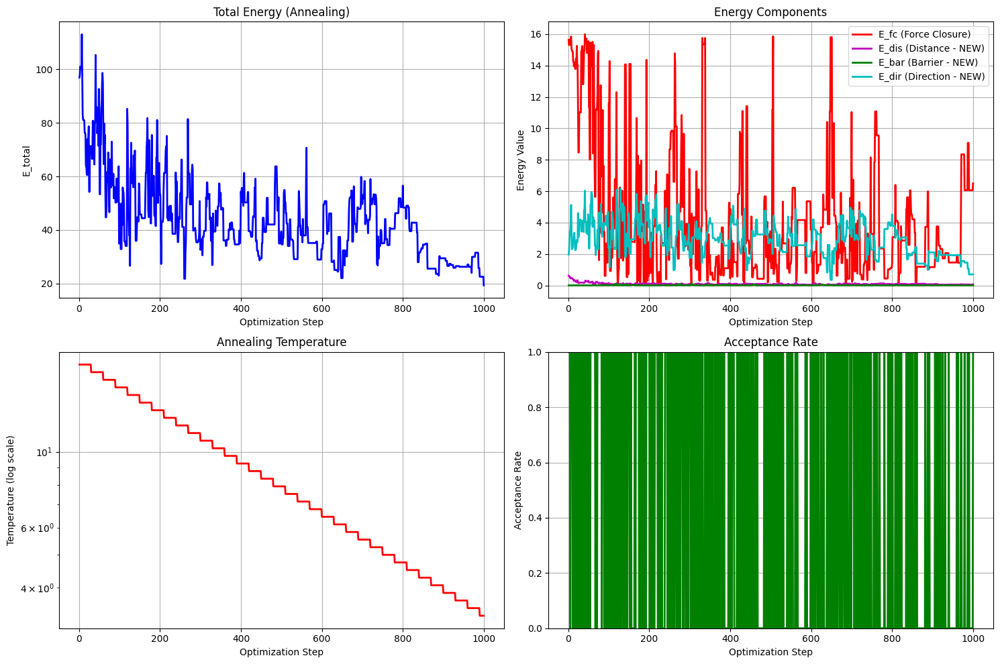


=== Annealing Optimization Results ===
Initial pose parameters (trans + rot): [ 0.2578855  -0.08021871 -0.00621538 -0.16625977 -0.8881836  -0.42797852]
Optimized pose parameters (trans + rot): [ 0.13508907 -0.00078075 -0.06002498 -0.185515   -0.7603937  -0.46220106]
Joint angle changes (mean): 0.184573
Hand model updated with annealing-optimized pose!

=== Final Energy Comparison ===
Final E_total: 19.305515
Final E_fc: 6.498730
Final E_dis (NEW): 0.057418
Final E_bar (NEW): 0.000000
Final E_dir (NEW): 0.706496
Final temperature: 3.312465
Final acceptance rate: 1.00


In [9]:
# Run Annealing Optimization (like generate_grasps.py)
print("=== Starting Annealing Grasp Optimization ===")

# Store initial pose for comparison
initial_pose = hand_model.hand_pose.clone()

# Run annealing optimization (shorter version for demo)
energy_history, optimized_pose = optimize_grasp_annealing(
    hand_model, object_model, xyz, contact_vals, annealing_args,
    num_steps=1000,   # Reduced for demo (original: 6000)
    verbose_step=100  # More frequent output
)

# Plot optimization history
plot_annealing_history(energy_history)

print(f"\n=== Annealing Optimization Results ===")
print(f"Initial pose parameters (trans + rot): {initial_pose[0, :6].detach().cpu().numpy()}")
print(f"Optimized pose parameters (trans + rot): {optimized_pose[0, :6].detach().cpu().numpy()}")
print(f"Joint angle changes (mean): {(optimized_pose[0, 9:] - initial_pose[0, 9:]).abs().mean().item():.6f}")

# Update hand model with optimized pose
hand_model.set_parameters(optimized_pose, hand_model.contact_point_indices)
print("Hand model updated with annealing-optimized pose!")

# Compare final energies
print(f"\n=== Final Energy Comparison ===")
final_energy_dict = energy_history[-1]
print(f"Final E_total: {final_energy_dict['E_total']:.6f}")
print(f"Final E_fc: {final_energy_dict['E_fc']:.6f}")
print(f"Final E_dis (NEW): {final_energy_dict['E_dis']:.6f}")
print(f"Final E_bar (NEW): {final_energy_dict['E_bar']:.6f}")
print(f"Final E_dir (NEW): {final_energy_dict['E_dir']:.6f}")
print(f"Final temperature: {final_energy_dict['temperature']:.6f}")
print(f"Final acceptance rate: {final_energy_dict['acceptance_rate']:.2f}")

In [10]:
# Visualize Optimized Results
try:
    # Create comparison visualization
    hand_plotly_opt = hand_model.get_plotly_data(i=0, opacity=0.7, color='lightblue', with_contact_points=True)
    object_plotly_opt = object_model.get_plotly_data(i=0, color='lightgreen', opacity=0.6)
    
    fig_opt = go.Figure(hand_plotly_opt + object_plotly_opt)
    
    # Add contact points from affordance map
    fig_opt.add_trace(go.Scatter3d(
        x=contact_points[:, 0],
        y=contact_points[:, 1], 
        z=contact_points[:, 2],
        mode='markers',
        marker=dict(color='red', size=3),
        name='Affordance Contact Points'
    ))
    
    # Add closest point and normal
    closest_point = xyz[closest_idx]
    normal_end = closest_point + representative_normal * 0.05
    
    fig_opt.add_trace(go.Scatter3d(
        x=[closest_point[0]],
        y=[closest_point[1]],
        z=[closest_point[2]],
        mode='markers',
        marker=dict(color='blue', size=8),
        name='Closest Point'
    ))
    
    fig_opt.add_trace(go.Scatter3d(
        x=[closest_point[0], normal_end[0]],
        y=[closest_point[1], normal_end[1]],
        z=[closest_point[2], normal_end[2]],
        mode='lines',
        line=dict(color='orange', width=6),
        name='Contact Normal'
    ))
    
    # Add optimized contact points
    opt_contact_points = hand_model.contact_points[0].detach().cpu().numpy()
    fig_opt.add_trace(go.Scatter3d(
        x=opt_contact_points[:, 0],
        y=opt_contact_points[:, 1],
        z=opt_contact_points[:, 2],
        mode='markers',
        marker=dict(color='yellow', size=6, symbol='diamond'),
        name='Optimized Contact Points'
    ))
    
    fig_opt.update_layout(
        title="Optimized Affordance-Aligned Grasping with Distance Energy",
        scene=dict(aspectmode='data'),
        width=800,
        height=600
    )
    
    fig_opt.show()
    print("Optimized visualization created successfully!")
    
    # Final energy computation and comparison
    with torch.no_grad():
        E_final, energy_dict_final = compute_total_energy(hand_model, object_model, xyz, contact_vals, args)
        
        print(f"\n=== Final Energy Analysis ===")
        print(f"Final E_total: {E_final.item():.6f}")
        print(f"Final E_fc: {energy_dict_final['E_fc'].item():.6f}")
        print(f"Final E_bar: {energy_dict_final['E_bar'].item():.6f}")
        print(f"Final E_dis: {energy_dict_final['E_dis'].item():.6f}")
        print(f"  - E_dis_fingertips: {energy_dict_final['E_dis_fingertips'].item():.6f}")
        print(f"  - E_dis_palm: {energy_dict_final['E_dis_palm'].item():.6f}")
        print(f"Final E_reg: {energy_dict_final['E_reg'].item():.6f}")
        print(f"  - E_pen: {energy_dict_final['E_pen'].item():.6f}")
        print(f"  - E_spen: {energy_dict_final['E_spen'].item():.6f}")
        print(f"  - E_joints: {energy_dict_final['E_joints'].item():.6f}")
        print(f"  - E_dir: {energy_dict_final['E_dir'].item():.6f}")
    
except Exception as e:
    print(f"Visualization failed: {e}")
    print("Hand model optimization completed, but visualization could not be generated")

Optimized visualization created successfully!
Visualization failed: name 'compute_total_energy' is not defined
Hand model optimization completed, but visualization could not be generated
